In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

The above info method finds observations such as there are 1000 rows & 40 columns, there no null values, there are 3 types of datatypes float, int and object.

In [5]:
#Converting the data type of policy_bind_date column to date_time using pd.to_datetime
df.policy_bind_date = pd.to_datetime(df['policy_bind_date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_number                1000 non-null   int64         
 3   policy_bind_date             1000 non-null   datetime64[ns]
 4   policy_state                 1000 non-null   object        
 5   policy_csl                   1000 non-null   object        
 6   policy_deductable            1000 non-null   int64         
 7   policy_annual_premium        1000 non-null   float64       
 8   umbrella_limit               1000 non-null   int64         
 9   insured_zip                  1000 non-null   int64         
 10  insured_sex                  1000 non-null   object        
 11  insured_education_level      1000 non-null  

In [6]:
con = []
cat = []
desc = []
for i in df.dtypes.index:
    if df.dtypes[i] == 'object':
        cat.append(i)
    elif df.dtypes[i] == 'float64':
        con.append(i)
    else:
        desc.append(i)
        

In [7]:
print("continuous columns::", '\n')
print(con)
print('\n')
print("Categorical columns::", '\n')
print(cat)
print('\n')
print("Descrete coluumns::",'\n')
print(desc)

continuous columns:: 

['policy_annual_premium', '_c39']


Categorical columns:: 

['policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Descrete coluumns:: 

['months_as_customer', 'age', 'policy_number', 'policy_bind_date', 'policy_deductable', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']


In [8]:
len(con)

2

In [9]:
len(cat)

20

In [10]:
#we have some missing values in the dataset represented by '?', so to eliminate them as outliers, lets replace them by np.nan

df.replace('?', np.nan, inplace = True)

In [11]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [12]:
#Filling missing values
missing = ['collision_type','property_damage','police_report_available']
for i in missing:
    df[i] = df[i].fillna(df[i].mode()[0])

In [13]:
for i in desc:
    print(i,'-',df[i].nunique(),'\n')

months_as_customer - 391 

age - 46 

policy_number - 1000 

policy_bind_date - 951 

policy_deductable - 3 

umbrella_limit - 11 

insured_zip - 995 

capital-gains - 338 

capital-loss - 354 

incident_hour_of_the_day - 24 

number_of_vehicles_involved - 4 

bodily_injuries - 3 

witnesses - 4 

total_claim_amount - 763 

injury_claim - 638 

property_claim - 626 

vehicle_claim - 726 

auto_year - 21 



In [14]:
for i in cat:
    print(i,'-', df[i].nunique(), '\n')

policy_state - 3 

policy_csl - 3 

insured_sex - 2 

insured_education_level - 7 

insured_occupation - 14 

insured_hobbies - 20 

insured_relationship - 6 

incident_date - 60 

incident_type - 4 

collision_type - 3 

incident_severity - 4 

authorities_contacted - 5 

incident_state - 7 

incident_city - 7 

incident_location - 1000 

property_damage - 2 

police_report_available - 2 

auto_make - 14 

auto_model - 39 

fraud_reported - 2 



In [15]:
for i in con:
    print(i,'-', df[i].nunique(), '\n')

policy_annual_premium - 991 

_c39 - 0 



In [16]:
df.nunique().to_frame("No of unique values")

,No of unique values
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


In [17]:
df['_c39']

0     NaN
1     NaN
2     NaN
3     NaN
4     NaN
       ..
995   NaN
996   NaN
997   NaN
998   NaN
999   NaN
Name: _c39, Length: 1000, dtype: float64

From all the above observations we can say that we longer need columns policy_number,incident_location  & _c39 as these columns have all the rows as unique values and _c39 has full of null values.

In [18]:
df.drop(df[['policy_number','incident_location','_c39']], axis = 1, inplace = True)

In [19]:
df.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,...,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,2000-06-09,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [20]:
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

There are no null values in the dataset.  So we can proceed with further with graphical analysis

In [21]:
df.describe().astype('int64').T

,count,mean,std,min,25%,50%,75%,max
months_as_customer,1000,203,115,0,115,199,276,479
age,1000,38,9,19,32,38,44,64
policy_deductable,1000,1136,611,500,500,1000,2000,2000
policy_annual_premium,1000,1256,244,433,1089,1257,1415,2047
umbrella_limit,1000,1101000,2297406,-1000000,0,0,0,10000000
insured_zip,1000,501214,71701,430104,448404,466445,603251,620962
capital-gains,1000,25126,27872,0,0,0,51025,100500
capital-loss,1000,-26793,28104,-111100,-51500,-23250,0,0
incident_hour_of_the_day,1000,11,6,0,6,12,17,23
number_of_vehicles_involved,1000,1,1,1,1,1,3,4


In [22]:
for i in df.columns:
    print(df[i].value_counts())
    print('\n')

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


2006-01-01    3
1992-04-28    3
1992-05-08    3
1991-12-14    2
2004-09-08    2
             ..
2014-03-06    1
1998-12-12    1
1999-02-18    1
1997-10-30    1
1996-11-11    1
Name: policy_bind_date, Length: 951, dtype: int64


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


1000    351
500     342
2000    3

univariate Analysis

In [23]:
count = ['fraud_reported', 'police_report_available','bodily_injuries','property_damage','incident_city','incident_state','authorities_contacted','incident_severity','collision_type','incident_type','insured_relationship','insured_sex','policy_csl','policy_deductable','policy_state']

In [24]:
len(count)

15

N    753
Y    247
Name: fraud_reported, dtype: int64


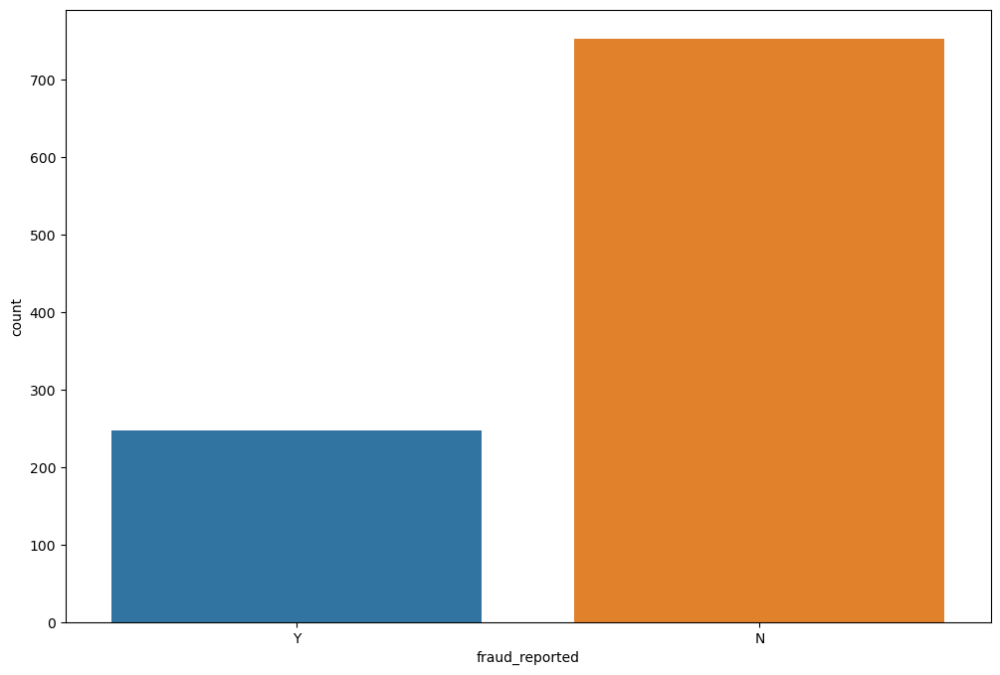

In [25]:
#Contplot on fraud reported
plt.figure(figsize = (12,8))
sns.countplot(x = 'fraud_reported', data = df )
print(df['fraud_reported'].value_counts())

As we observe from the above plot there are more 'No' than 'Yes' i.e there are more case where fraud is not reported. This leads to class imbalance in the data(Yes:No ratio has huge difference). We will rectify it by oversampling method in later part.

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_bind_date             1000 non-null   datetime64[ns]
 3   policy_state                 1000 non-null   object        
 4   policy_csl                   1000 non-null   object        
 5   policy_deductable            1000 non-null   int64         
 6   policy_annual_premium        1000 non-null   float64       
 7   umbrella_limit               1000 non-null   int64         
 8   insured_zip                  1000 non-null   int64         
 9   insured_sex                  1000 non-null   object        
 10  insured_education_level      1000 non-null   object        
 11  insured_occupation           1000 non-null  

0    340
2    332
1    328
Name: bodily_injuries, dtype: int64


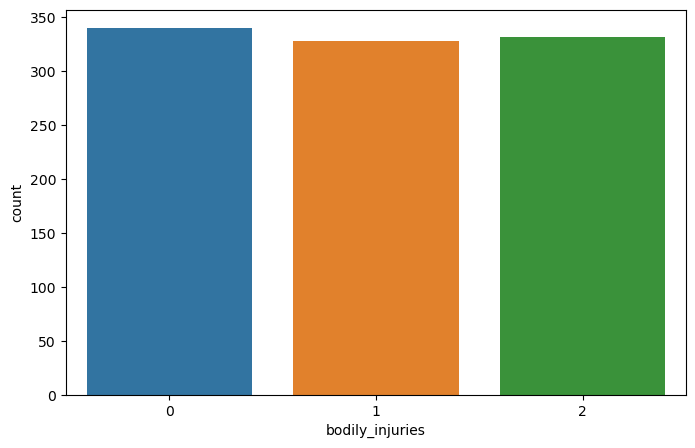

In [27]:
# Counting no of types of bodily injuries occured
plt.figure(figsize = (8,5))
sns.countplot(x = 'bodily_injuries', data = df )
print(df['bodily_injuries'].value_counts())

NO     686
YES    314
Name: police_report_available, dtype: int64


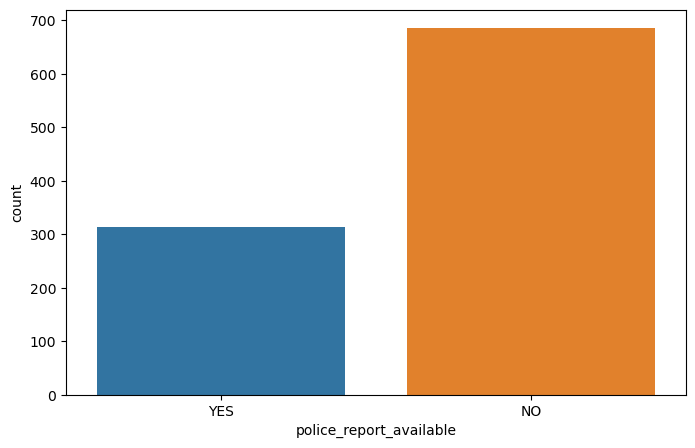

In [28]:
# Counting no of cases having police reports
plt.figure(figsize = (8,5))
sns.countplot(x = 'police_report_available', data = df )
print(df['police_report_available'].value_counts())

From the above plot we can see that there are 343 cases where police report is not there and in 343 cases not sure about the police report

NO     698
YES    302
Name: property_damage, dtype: int64


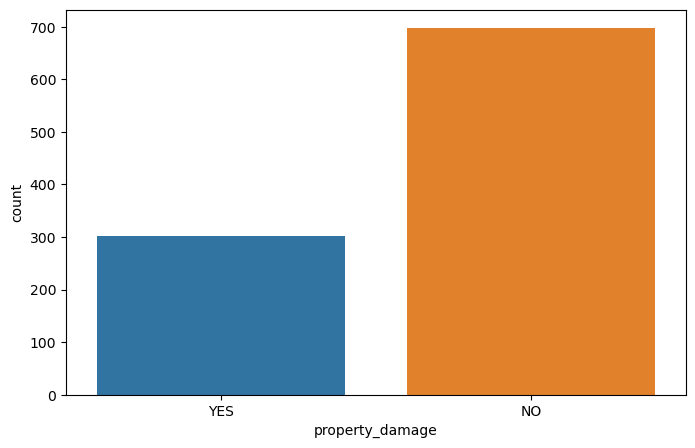

In [29]:
# Counting no of property damage occured
plt.figure(figsize = (8,5))
sns.countplot(x = 'property_damage', data = df )
print(df['property_damage'].value_counts())

There are more 338 instances where property damage has not been occured. And 360 instances are not sure and 302 instances property damage occured.

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


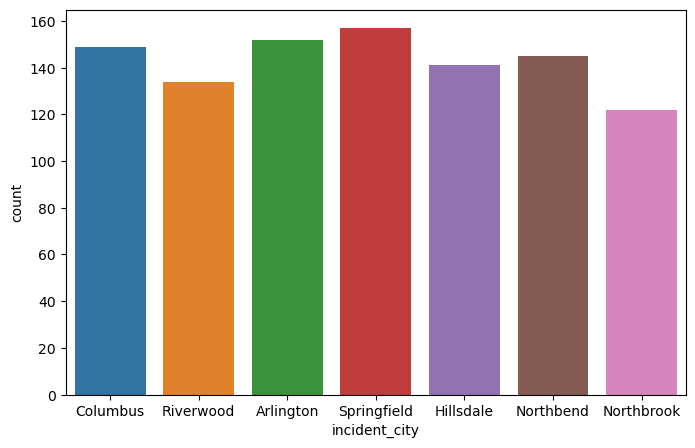

In [30]:
#Count of the cities where more no of incidents occured
plt.figure(figsize = (8,5))
sns.countplot(x = 'incident_city', data = df )
print(df['incident_city'].value_counts())

In Springfield incident_city 157 cases which is the highest of all.
Northbrook with 122 cases is the lowest of all. 

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


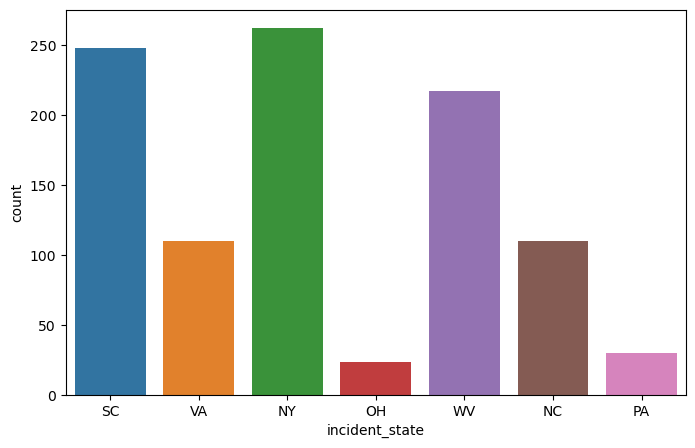

In [31]:
#Count of the state where more no of incidents occured
plt.figure(figsize = (8,5))
sns.countplot(x = 'incident_state', data = df )
print(df['incident_state'].value_counts())

From the above observation we can see that New york has the most no of incidents occure with 262 cases. ohio being the lowest with 23 cases.

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


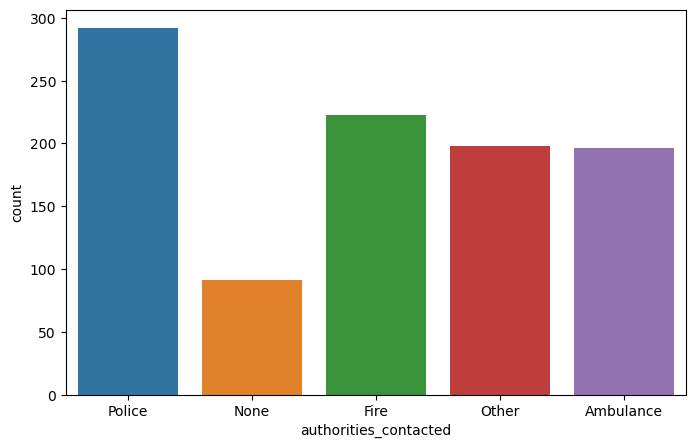

In [32]:
#Count of the authorities contaccted after the incident
plt.figure(figsize = (8,5))
sns.countplot(x = 'authorities_contacted', data = df )
print(df['authorities_contacted'].value_counts())

From the above observations we can notice that most no of incidents contacted to the police 292 and only in 91 instances none has been contacted

Rear Collision     470
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64


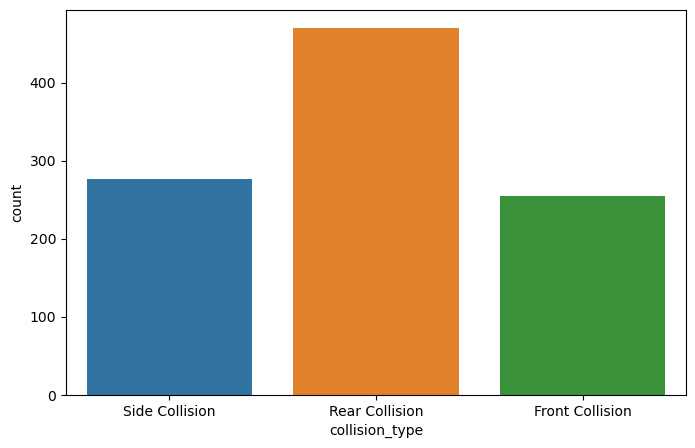

In [33]:
#Count of the authorities contaccted after the incident
plt.figure(figsize = (8,5))
sns.countplot(x = 'collision_type', data = df )
print(df['collision_type'].value_counts())

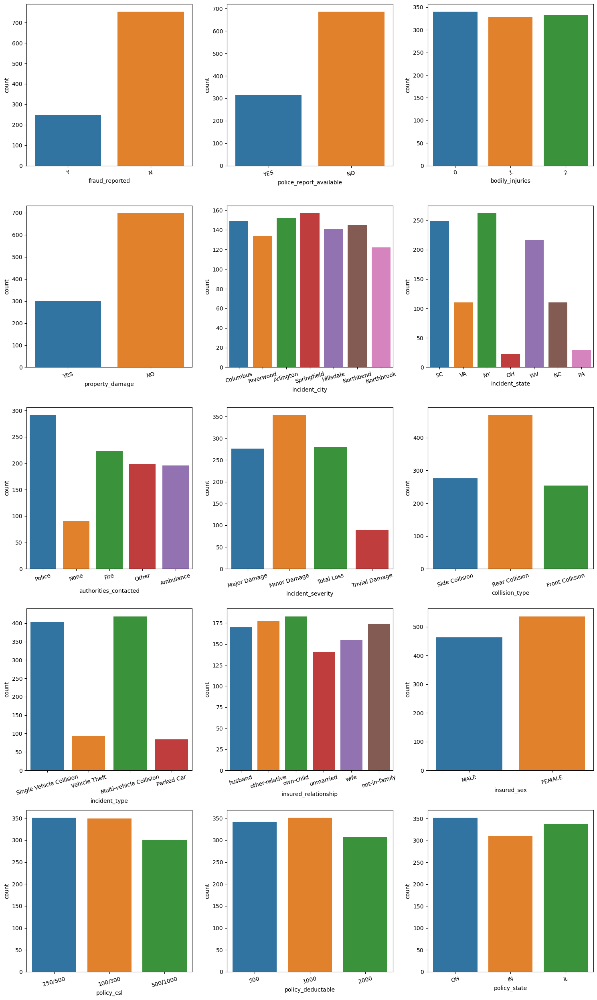

In [34]:
#Count plots of all the categorical data
plt.figure(figsize = (15,25))
point = 1
for i in enumerate(count):
    if point<=21:
        plt.subplot(5,3,point)
        sns.countplot(x = i[1],data  = df)
        plt.xticks(rotation = 15)
    point+=1
plt.tight_layout()

<AxesSubplot:xlabel='policy_annual_premium', ylabel='Density'>

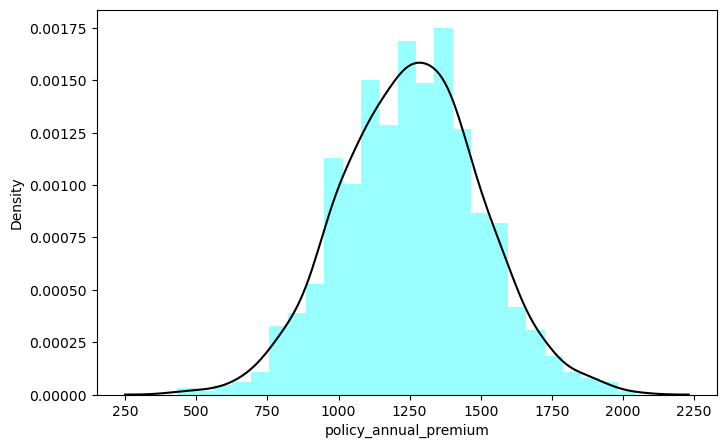

In [35]:
plt.figure(figsize = (8,5))

sns.distplot(df['policy_annual_premium'], color = 'cyan', kde = True,kde_kws = {'color':'black'})


By above distribution plot of policy_annum_premium is almost normally dirtibuted

#### Multivariate analysis

<Figure size 800x500 with 0 Axes>

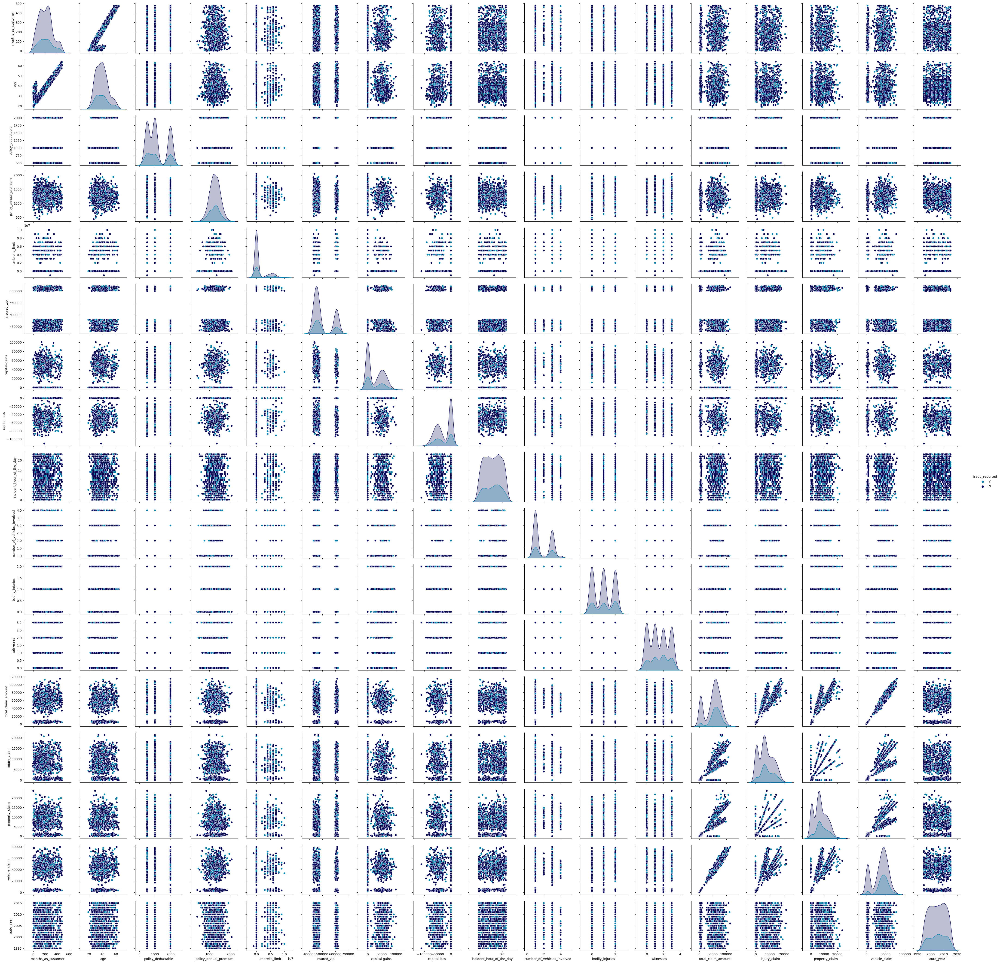

In [36]:
plt.figure(figsize = (8,5))
sns.pairplot(df, hue = 'fraud_reported', palette = 'ocean_r')
plt.show()

The pairplot gives the pairwise relation between the features on the basis of target variable'fruad_reported'. On the diagonal we can notice the distribution plots.
total_claim_amount are highly correlated, injury_claim & total_claim_amount are highly correlated, property_claim and injury_claim are highly correlated with vehicle_claim.

In [37]:
df.auto_model.value_counts()

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

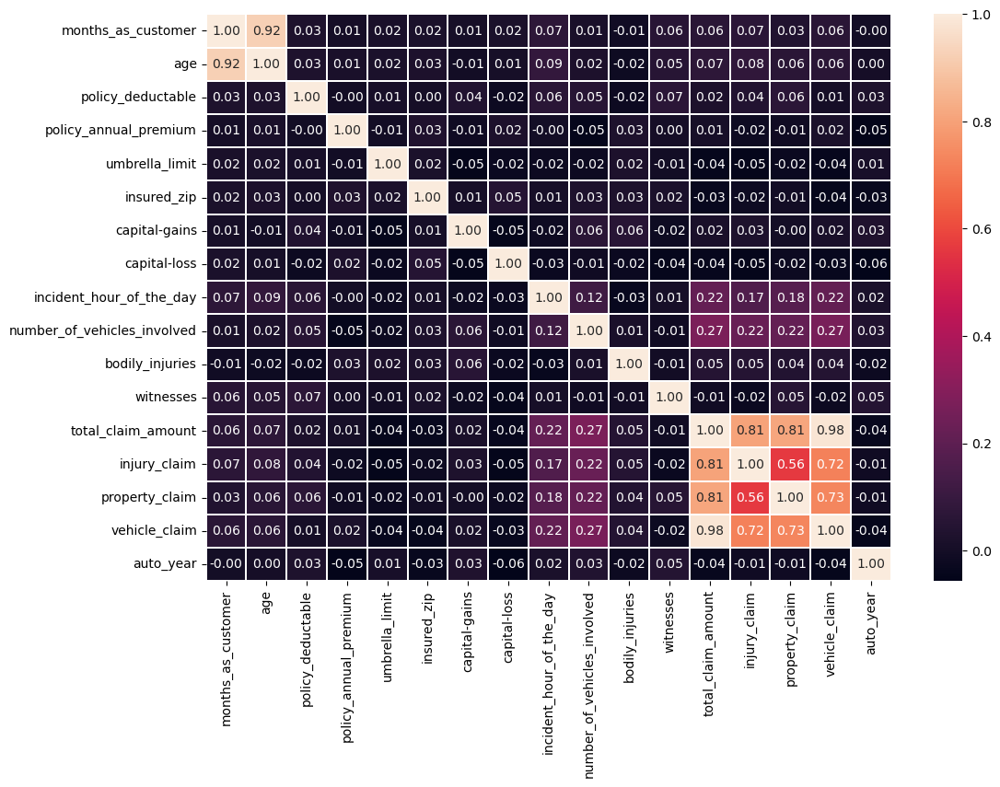

In [38]:
#Checking correlation among the feature and target columns
cor = df.corr()
plt.figure(figsize = (12,8))
sns.heatmap(cor, annot = True, fmt = '0.2f', linewidths = 0.2)
plt.show()

In [39]:
df.columns

Index(['months_as_customer', 'age', 'policy_bind_date', 'policy_state',
       'policy_csl', 'policy_deductable', 'policy_annual_premium',
       'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_hour_of_the_day', 'number_of_vehicles_involved',
       'property_damage', 'bodily_injuries', 'witnesses',
       'police_report_available', 'total_claim_amount', 'injury_claim',
       'property_claim', 'vehicle_claim', 'auto_make', 'auto_model',
       'auto_year', 'fraud_reported'],
      dtype='object')

By correlation matrix we can say that the columns months_as_customer & age are highly correlated, property_claim & total_claim_amount are highly correlated, injury_claim & total_claim_amount are highly correlated, property_claim and injury_claim are highly correlated with vehicle_claim.
And the columns policy_bind_date,policy_annual_premium,umbrella_limit,insured_zip,capital-gains and capital-loss are no tp less correlated to the data set.

In [40]:
# dropping less correlated columns and unnecessary columns
df.drop(['policy_bind_date','policy_state','incident_date','incident_state','incident_city','insured_hobbies','auto_make','auto_model','auto_year','insured_zip'], axis = 1, inplace =True)
df

,months_as_customer,age,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,...,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,48,250/500,1000,1406.91,0,MALE,MD,craft-repair,husband,...,1,YES,1,2,YES,71610,6510,13020,52080,Y
1,228,42,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,other-relative,...,1,NO,0,0,NO,5070,780,780,3510,Y
2,134,29,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,own-child,...,3,NO,2,3,NO,34650,7700,3850,23100,N
3,256,41,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,unmarried,...,1,NO,1,2,NO,63400,6340,6340,50720,Y
4,228,44,500/1000,1000,1583.91,6000000,MALE,Associate,sales,unmarried,...,1,NO,0,1,NO,6500,1300,650,4550,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,unmarried,...,1,YES,0,1,NO,87200,17440,8720,61040,N
996,285,41,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,wife,...,1,YES,2,3,NO,108480,18080,18080,72320,N
997,130,34,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,other-relative,...,3,NO,2,3,YES,67500,7500,7500,52500,N
998,458,62,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,wife,...,1,NO,0,1,YES,46980,5220,5220,36540,N


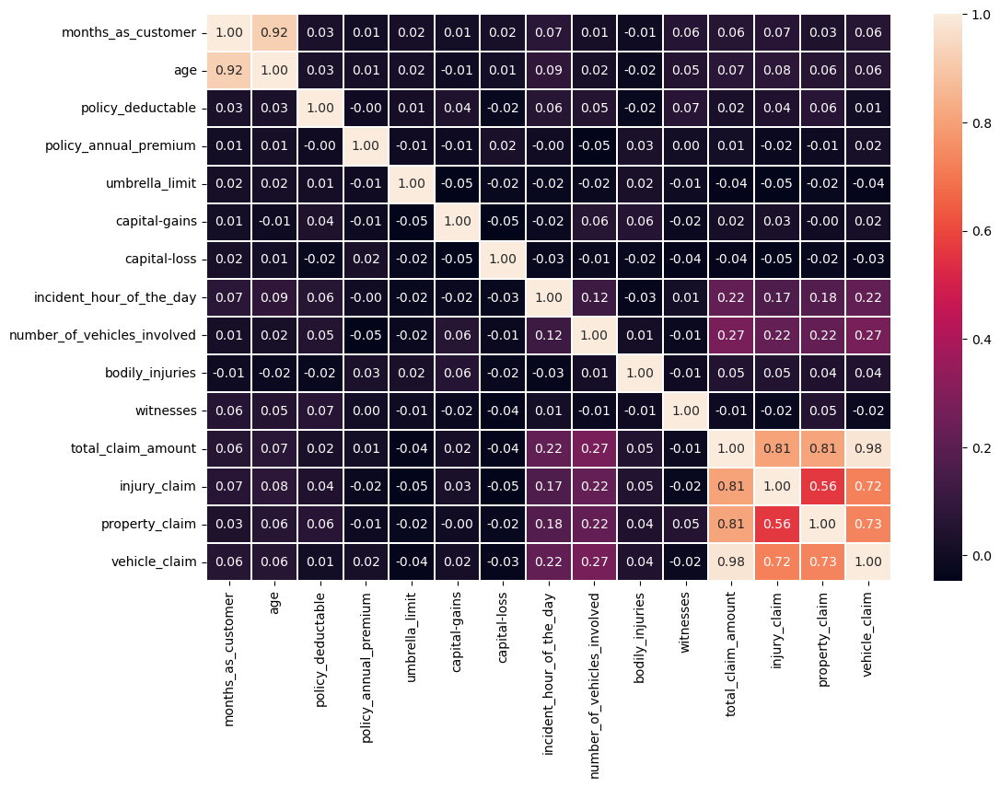

In [41]:
cor = df.corr()
plt.figure(figsize = (12,8))
sns.heatmap(cor, annot = True, fmt = '0.2f', linewidths = 0.2)
plt.show()

We can see that there is high correlation between age and months_as_customer.We will drop the "Age" column. Also there is high correlation between total_clam_amount, injury_claim, property_claim, vehicle_claim as total claim is the sum of all others. So we will drop the total claim column.

In [42]:
df.drop(['age','total_claim_amount'], axis = 1, inplace = True)
df

,months_as_customer,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,...,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,250/500,1000,1406.91,0,MALE,MD,craft-repair,husband,53300,...,5,1,YES,1,2,YES,6510,13020,52080,Y
1,228,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,other-relative,0,...,8,1,NO,0,0,NO,780,780,3510,Y
2,134,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,own-child,35100,...,7,3,NO,2,3,NO,7700,3850,23100,N
3,256,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,unmarried,48900,...,5,1,NO,1,2,NO,6340,6340,50720,Y
4,228,500/1000,1000,1583.91,6000000,MALE,Associate,sales,unmarried,66000,...,20,1,NO,0,1,NO,1300,650,4550,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,500/1000,1000,1310.80,0,FEMALE,Masters,craft-repair,unmarried,0,...,20,1,YES,0,1,NO,17440,8720,61040,N
996,285,100/300,1000,1436.79,0,FEMALE,PhD,prof-specialty,wife,70900,...,23,1,YES,2,3,NO,18080,18080,72320,N
997,130,250/500,500,1383.49,3000000,FEMALE,Masters,armed-forces,other-relative,35100,...,4,3,NO,2,3,YES,7500,7500,52500,N
998,458,500/1000,2000,1356.92,5000000,MALE,Associate,handlers-cleaners,wife,0,...,2,1,NO,0,1,YES,5220,5220,36540,N


In [43]:
df.head()

,months_as_customer,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,...,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,250/500,1000,1406.91,0,MALE,MD,craft-repair,husband,53300,...,5,1,YES,1,2,YES,6510,13020,52080,Y
1,228,250/500,2000,1197.22,5000000,MALE,MD,machine-op-inspct,other-relative,0,...,8,1,NO,0,0,NO,780,780,3510,Y
2,134,100/300,2000,1413.14,5000000,FEMALE,PhD,sales,own-child,35100,...,7,3,NO,2,3,NO,7700,3850,23100,N
3,256,250/500,2000,1415.74,6000000,FEMALE,PhD,armed-forces,unmarried,48900,...,5,1,NO,1,2,NO,6340,6340,50720,Y
4,228,500/1000,1000,1583.91,6000000,MALE,Associate,sales,unmarried,66000,...,20,1,NO,0,1,NO,1300,650,4550,N


#### Label encoding

In [44]:
from sklearn.preprocessing import LabelEncoder

In [45]:
oe = LabelEncoder()
for i in df.columns:
    if df[i].dtypes == 'object':
        df[i] = oe.fit_transform(df[i].values.reshape(-1,1))

In [46]:
df.head()

,months_as_customer,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,...,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim,fraud_reported
0,328,1,1000,1406.91,0,1,4,2,0,53300,...,5,1,1,1,2,1,6510,13020,52080,1
1,228,1,2000,1197.22,5000000,1,4,6,2,0,...,8,1,0,0,0,0,780,780,3510,1
2,134,0,2000,1413.14,5000000,0,6,11,3,35100,...,7,3,0,2,3,0,7700,3850,23100,0
3,256,1,2000,1415.74,6000000,0,6,1,4,48900,...,5,1,0,1,2,0,6340,6340,50720,1
4,228,2,1000,1583.91,6000000,1,0,11,4,66000,...,20,1,0,0,1,0,1300,650,4550,0


In [47]:
# separating the feature and target columns
x = df.drop('fraud_reported', axis = 1)
y = df['fraud_reported']

In [48]:
x

,months_as_customer,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,...,authorities_contacted,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim
0,328,1,1000,1406.91,0,1,4,2,0,53300,...,4,5,1,1,1,2,1,6510,13020,52080
1,228,1,2000,1197.22,5000000,1,4,6,2,0,...,4,8,1,0,0,0,0,780,780,3510
2,134,0,2000,1413.14,5000000,0,6,11,3,35100,...,4,7,3,0,2,3,0,7700,3850,23100
3,256,1,2000,1415.74,6000000,0,6,1,4,48900,...,4,5,1,0,1,2,0,6340,6340,50720
4,228,2,1000,1583.91,6000000,1,0,11,4,66000,...,2,20,1,0,0,1,0,1300,650,4550
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,2,1000,1310.80,0,0,5,2,4,0,...,1,20,1,1,0,1,0,17440,8720,61040
996,285,0,1000,1436.79,0,0,6,9,5,70900,...,1,23,1,1,2,3,0,18080,18080,72320
997,130,1,500,1383.49,3000000,0,5,1,2,35100,...,4,4,3,0,2,3,1,7500,7500,52500
998,458,2,2000,1356.92,5000000,1,0,5,5,0,...,3,2,1,0,0,1,1,5220,5220,36540


In [49]:
y

0      1
1      1
2      0
3      1
4      0
      ..
995    0
996    0
997    0
998    0
999    0
Name: fraud_reported, Length: 1000, dtype: int32

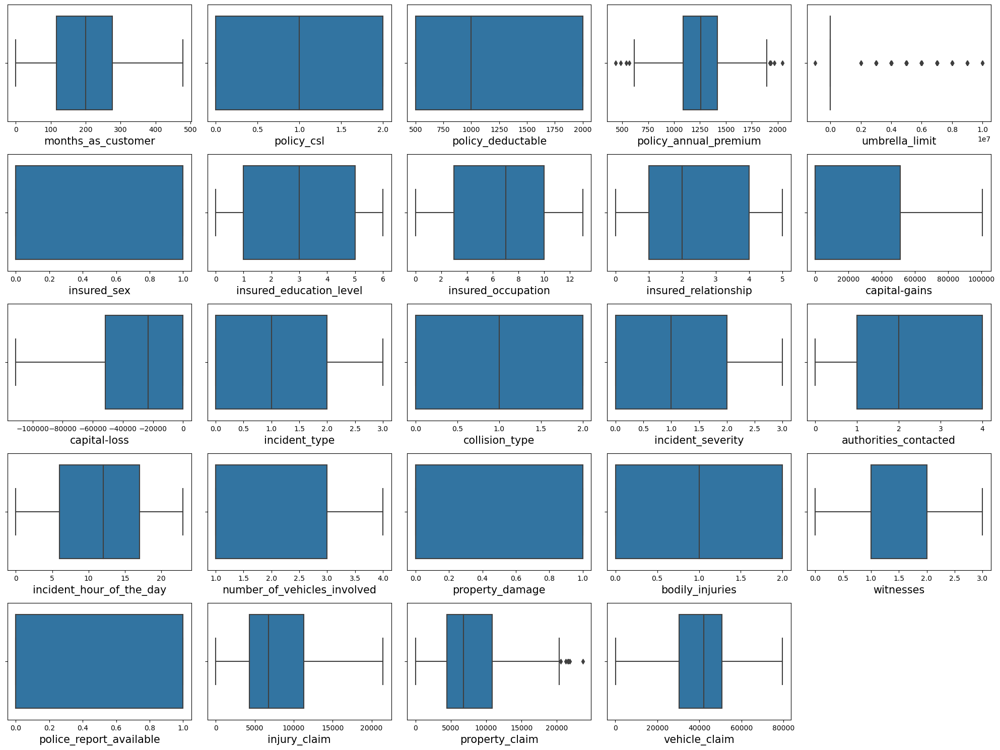

In [50]:
#Outliers detetction
plt.figure(figsize = (20, 15))
plotnumber = 1

for col in x.columns:
    if plotnumber <= 24:
        ax = plt.subplot(5, 5, plotnumber)
        sns.boxplot(x[col])
        plt.xlabel(col, fontsize = 15)
    
    plotnumber += 1
plt.tight_layout()
plt.show()

In [51]:
x.skew()

months_as_customer             0.362177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.033682
incident_severity              0.279016
authorities_contacted         -0.121744
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.863806
bodily_injuries                0.014777
witnesses                      0.019636
police_report_available        0.802728
injury_claim                   0.264811
property_claim                 0.378169
vehicle_claim                 -0.621098
dtype: float64

Skewness is not that high from threshold(+/- 0.5). 

In [52]:
#scaling the numeric values in the dataset
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,months_as_customer,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_relationship,capital-gains,...,authorities_contacted,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,injury_claim,property_claim,vehicle_claim
0,1.078140,0.060937,-0.222383,0.616705,-0.479476,1.076953,0.530931,-1.158316,-1.437957,1.011331,...,1.196963,-0.956261,-0.823865,1.520282,0.009759,0.461838,1.478078,-0.189283,1.165505,0.749653
1,0.208995,0.060937,1.412784,-0.242521,1.697980,1.076953,0.530931,-0.162558,-0.247595,-0.901927,...,1.196963,-0.524475,-0.823865,-0.657773,-1.210174,-1.338700,-0.676554,-1.363822,-1.372696,-1.823346
2,-0.608002,-1.182668,1.412784,0.642233,1.697980,-0.928546,1.557877,1.082141,0.347586,0.358023,...,1.196963,-0.668404,1.140056,-0.657773,1.229693,1.362107,-0.676554,0.054644,-0.736072,-0.785565
3,0.452355,0.060937,1.412784,0.652886,2.133471,-0.928546,1.557877,-1.407256,0.942766,0.853388,...,1.196963,-0.956261,-0.823865,-0.657773,0.009759,0.461838,-0.676554,-0.224130,-0.219722,0.677607
4,0.208995,1.304542,-0.222383,1.341980,2.133471,1.076953,-1.522961,1.082141,0.942766,1.467210,...,-0.109052,1.202666,-0.823865,-0.657773,-1.210174,-0.438431,-0.676554,-1.257232,-1.399654,-1.768252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-1.746582,1.304542,-0.222383,0.222884,-0.479476,-0.928546,1.044404,-1.158316,0.942766,-0.901927,...,-0.762060,1.202666,-0.823865,1.520282,-1.210174,-0.438431,-0.676554,2.051155,0.273817,1.224309
996,0.704407,-1.182668,-0.222383,0.739141,-0.479476,-0.928546,1.557877,0.584261,1.537947,1.643100,...,-0.762060,1.634452,-0.823865,1.520282,1.229693,1.362107,-0.676554,2.182342,2.214794,1.821868
997,-0.642767,0.060937,-1.039966,0.520739,0.826998,-0.928546,1.044404,-1.407256,-0.247595,0.358023,...,1.196963,-1.100189,1.140056,-0.657773,1.229693,1.362107,1.478078,0.013648,0.020826,0.771902
998,2.208028,1.304542,1.412784,0.411866,1.697980,1.076953,-1.522961,-0.411497,1.537947,-0.901927,...,0.543955,-1.388046,-0.823865,-0.657773,-1.210174,-0.438431,1.478078,-0.453708,-0.451976,-0.073580


we have standardized the data using StandardScaler method to reduce biasness

### Checking varianceinfationfactor(VIF)

In [53]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,1.032314,months_as_customer
1,1.020134,policy_csl
2,1.031250,policy_deductable
3,1.025656,policy_annual_premium
4,1.021982,umbrella_limit
5,1.018947,insured_sex
6,1.026505,insured_education_level
7,1.009060,insured_occupation
8,1.024547,insured_relationship
9,1.019426,capital-gains


In [54]:
#Dropping number_of_vehicles_involved column
x.drop("number_of_vehicles_involved",axis = 1, inplace = True)

In [55]:
#Again checking the multicolinearity problem exists or not
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF values,Features
0,1.032295,months_as_customer
1,1.019928,policy_csl
2,1.029642,policy_deductable
3,1.025655,policy_annual_premium
4,1.021893,umbrella_limit
5,1.014557,insured_sex
6,1.026411,insured_education_level
7,1.008477,insured_occupation
8,1.023347,insured_relationship
9,1.017348,capital-gains


 we have solved multicolinearity problem. We can go ahead and build a model

In [56]:
y.value_counts()

0    753
1    247
Name: fraud_reported, dtype: int64

Here we can see the data is not balanced, since it is a classification problem we will balance the data using oversampling method

### Oversampling

In [57]:
#Oversampling the data SMOTE is applied on feature and target variable and not on training data
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x,y = sm.fit_resample(x,y)

In [58]:
#checking value counts after oversampling
y.value_counts()

1    753
0    753
Name: fraud_reported, dtype: int64

Checking for best accuaracy and random state

In [59]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRs = 0
for i in range(1,200):
    x_train,x_test, y_train, y_test = train_test_split(x,y, test_size = 0.30, random_state = i)
    rf = RandomForestClassifier()
    rf.fit(x_train,y_train)
    pred = rf.predict(x_test)
    accu = accuracy_score(y_test, pred)
    if accu>maxAccu:
        maxAccu = accu
        maxRs =i
print("Best accuracy is", maxAccu, "at random_state", maxRs)

Best accuracy is 0.9004424778761062 at random_state 80


In [60]:
#Creating train test split at maxRs
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.30, random_state = maxRs)

#### Classification Algorithms

In [61]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve,accuracy_score
from sklearn.model_selection import  cross_val_score



Random Forest Classifier

In [62]:
# Checking accuracy score for RandomForestClassifier
rs = RandomForestClassifier()
rs.fit(x_train,y_train)
predc = rs.predict(x_test)
print((accuracy_score(y_test,predc))*100)
print(confusion_matrix(y_test, predc))
print(classification_report(y_test,predc))

89.38053097345133
[[196  25]
 [ 23 208]]
              precision    recall  f1-score   support

           0       0.89      0.89      0.89       221
           1       0.89      0.90      0.90       231

    accuracy                           0.89       452
   macro avg       0.89      0.89      0.89       452
weighted avg       0.89      0.89      0.89       452



Logistic Regression

In [63]:
#Checking accuracy score for logisticregression
ls = LogisticRegression()
ls.fit(x_train,y_train)
predd = ls.predict(x_test)
print(accuracy_score(y_test,predd))
print(confusion_matrix(y_test,predd))
print(classification_report(y_test,predd))

0.7588495575221239
[[161  60]
 [ 49 182]]
              precision    recall  f1-score   support

           0       0.77      0.73      0.75       221
           1       0.75      0.79      0.77       231

    accuracy                           0.76       452
   macro avg       0.76      0.76      0.76       452
weighted avg       0.76      0.76      0.76       452



Support Vector Machine

In [64]:
sv = SVC()
sv.fit(x_train,y_train)
predd = sv.predict(x_test)
print(accuracy_score(y_test,predd))
print(confusion_matrix(y_test,predd))
print(classification_report(y_test,predd))

0.8650442477876106
[[179  42]
 [ 19 212]]
              precision    recall  f1-score   support

           0       0.90      0.81      0.85       221
           1       0.83      0.92      0.87       231

    accuracy                           0.87       452
   macro avg       0.87      0.86      0.86       452
weighted avg       0.87      0.87      0.86       452



GradientBoosting Classifier

In [65]:
gd = GradientBoostingClassifier()
gd.fit(x_train,y_train)
predd = gd.predict(x_test)
print(accuracy_score(y_test,predd))
print(confusion_matrix(y_test,predd))
print(classification_report(y_test,predd))

0.8849557522123894
[[195  26]
 [ 26 205]]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       221
           1       0.89      0.89      0.89       231

    accuracy                           0.88       452
   macro avg       0.88      0.88      0.88       452
weighted avg       0.88      0.88      0.88       452



Ada Boost Classifier

In [66]:
ad = AdaBoostClassifier()
ad.fit(x_train,y_train)
predd = ad.predict(x_test)
print(accuracy_score(y_test,predd))
print(confusion_matrix(y_test,predd))
print(classification_report(y_test,predd))

0.8672566371681416
[[194  27]
 [ 33 198]]
              precision    recall  f1-score   support

           0       0.85      0.88      0.87       221
           1       0.88      0.86      0.87       231

    accuracy                           0.87       452
   macro avg       0.87      0.87      0.87       452
weighted avg       0.87      0.87      0.87       452



Bagging Classifier

In [67]:
bg = BaggingClassifier()
bg.fit(x_train,y_train)
predd = bg.predict(x_test)
print(accuracy_score(y_test,predd))
print(confusion_matrix(y_test,predd))
print(classification_report(y_test,predd))

0.8561946902654868
[[195  26]
 [ 39 192]]
              precision    recall  f1-score   support

           0       0.83      0.88      0.86       221
           1       0.88      0.83      0.86       231

    accuracy                           0.86       452
   macro avg       0.86      0.86      0.86       452
weighted avg       0.86      0.86      0.86       452



Extra Trees Classfier

In [68]:
ex = ExtraTreesClassifier()
ex.fit(x_train,y_train)
predd = ex.predict(x_test)
print(accuracy_score(y_test,predd))
print(confusion_matrix(y_test,predd))
print(classification_report(y_test,predd))

0.9247787610619469
[[201  20]
 [ 14 217]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       221
           1       0.92      0.94      0.93       231

    accuracy                           0.92       452
   macro avg       0.93      0.92      0.92       452
weighted avg       0.93      0.92      0.92       452



#### Cross validation

In [69]:
score = cross_val_score(rs,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.73509934 0.83056478 0.90697674 0.94019934 0.94019934]
0.8706079074167785
Difference between Accuracy Score and cross validation score is -  0.023197402317734706


In [70]:
# cross validation score for Logistic Regression
score = cross_val_score(ls, x, y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.75496689 0.72425249 0.69435216 0.76079734 0.78737542]
0.7443488592110185
Difference between Accuracy Score and cross validation score is -  0.14945645052349477


In [71]:
# cross validation score for Support Vector Machine
score = cross_val_score(sv, x, y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.79470199 0.80066445 0.8372093  0.87375415 0.89700997]
0.840667972101824
Difference between Accuracy Score and cross validation score is -  0.05313733763268924


In [72]:
# cross validation score for GradientBoosting Classifier
score = cross_val_score(gd, x, y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.70529801 0.80066445 0.90365449 0.95016611 0.93355482]
0.8586675760709335
Difference between Accuracy Score and cross validation score is -  0.03513773366357975


In [73]:
# cross validation score for Ada Boost Classifier
score = cross_val_score(ad, x, y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.6986755  0.77408638 0.90033223 0.88704319 0.910299  ]
0.8340872588061868
Difference between Accuracy Score and cross validation score is -  0.05971805092832638


In [74]:
# cross validation score for Bagging Classifier
score = cross_val_score(bg, x, y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.70529801 0.7807309  0.88372093 0.92358804 0.9269103 ]
0.8440496358715981
Difference between Accuracy Score and cross validation score is -  0.04975567386291513


In [75]:
# cross validation score for Etra Tree Classifier
score = cross_val_score(ex, x, y)
print(score)
print(score.mean())
print("Difference between Accuracy Score and cross validation score is - ",accuracy_score(y_test, predc)-score.mean())

[0.87417219 0.88372093 0.92358804 0.94684385 0.94019934]
0.9137048689797804
Difference between Accuracy Score and cross validation score is -  -0.019899559245267207


By evaluating the cross validation scores for all the classification algorithm we conclude that Extra Tree Classifier is the best algorithm since the differnece between accuracy score and validation score is least

#### Hyper parameter tuning

In [76]:
# Each classification algorithm is having different parameters for gridsearch cv
# Extra Tree Classifier
from sklearn.model_selection import GridSearchCV

parameters = {'criterion': ['gini', 'entropy'],
               'random_state': [10,15,25,50],
               'max_depth': [0,10,20],
               'n_jobs':[-2,-1,-1]
               }

In [77]:
gcv = GridSearchCV(ExtraTreesClassifier(), parameters, cv = 3)
gcv.fit(x_train, y_train)

GridSearchCV(cv=3, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20], 'n_jobs': [-2, -1, -1],
                         'random_state': [10, 15, 25, 50]})

In [78]:
gcv.best_params_

{'criterion': 'entropy', 'max_depth': 20, 'n_jobs': -2, 'random_state': 10}

In [79]:
Final_model = ExtraTreesClassifier(criterion = 'gini', max_depth = 20, n_jobs =  -2, random_state = 25)
Final_model.fit(x_train,y_train)
predict = Final_model.predict(x_test)
acc = accuracy_score(y_test,predd)
print(acc*100)

92.47787610619469


In [80]:
#saving the model using .pkl
import joblib
joblib.dump(Final_model,"Insurance_fraud_detection.pkl")

['Insurance_fraud_detection.pkl']

In [81]:
#predicting the saved model
model = joblib.load("Insurance_fraud_detection.pkl")

#prediction
prediction = model.predict(x_test)
prediction

array([1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0,
       0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1,

In [82]:
a = np.array(y_test)
df = pd.DataFrame()
df['Predicted'] = prediction
df['Original'] = a

In [83]:
df

,Predicted,Original
0,1,1
1,0,0
2,1,1
3,1,1
4,1,0
...,...,...
447,1,1
448,1,0
449,0,0
450,1,1


In [84]:
from sklearn.metrics import roc_auc_score, auc
from sklearn.metrics import roc_curve

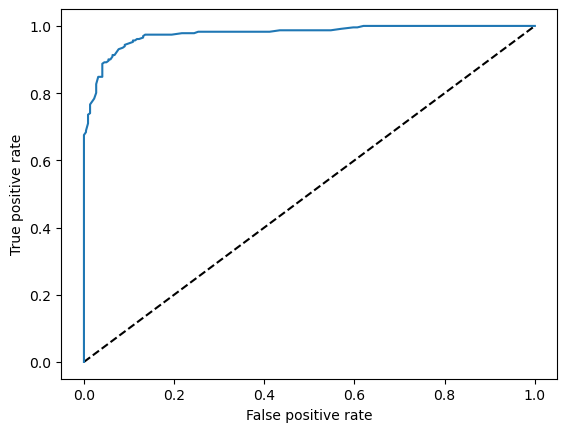

Auc score: 
 0.9242522183698654


In [87]:
y_pred_prob = Final_model.predict_proba(x_test)[:,1]
fpr,tpr,thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr,tpr)

plt.plot([0,1],[0,1], 'k--')
plt.plot(fpr,tpr, label = 'ExtraTreesClassifier(area=%0.2f)'%roc_auc)
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.show()
auc_score = roc_auc_score(y_test,Final_model.predict(x_test))
print('Auc score:','\n', auc_score)

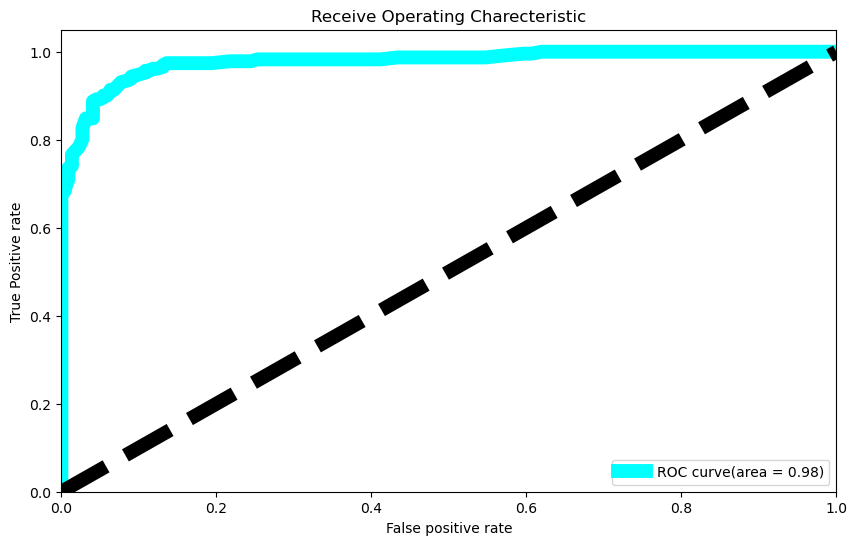

In [86]:
fpr,tpr,thresholds = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr,tpr)

plt.figure(figsize = (10,6))
plt.plot(fpr,tpr, color = 'cyan', lw = 10, label = 'ROC curve(area = %0.2f)'%roc_auc)
plt.plot([0,1],[0,1],color = 'black',lw = 10, linestyle = '--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel("False positive rate")
plt.ylabel("True Positive rate")
plt.title("Receive Operating Charecteristic")
plt.legend(loc = "lower right")
plt.show()